In [2]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [3]:
adata = sc.read_h5ad('datasets/slidetag_LN/slidetag_LN.h5ad')

In [4]:
from simvi.model import SimVI
SimVI.setup_anndata(adata)
edge_index = SimVI.extract_edge_index(adata,n_neighbors=10)

Global seed set to 0
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [6]:
from pytorch_lightning.utilities.seed import seed_everything
seed_everything(0)
model = SimVI(adata,kl_weight=1,kl_gatweight=0.01,lam_mi=1000,permutation_rate=0.5,n_spatial=20,n_intrinsic=20)
train_loss, val_loss = model.train(edge_index,max_epochs=100,batch_size=1000,use_gpu=True,mae_epochs=25,device='cuda:2')

Global seed set to 0
Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:41<00:00,  2.39it/s, train_loss=1.08e+3, val_loss=1118.1699]


In [7]:
adata.obsm['simvi_z'] = model.get_latent_representation(edge_index,representation_kind='intrinsic',give_mean=True)
adata.obsm['simvi_s'] = model.get_latent_representation(edge_index,representation_kind='interaction',give_mean=True)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


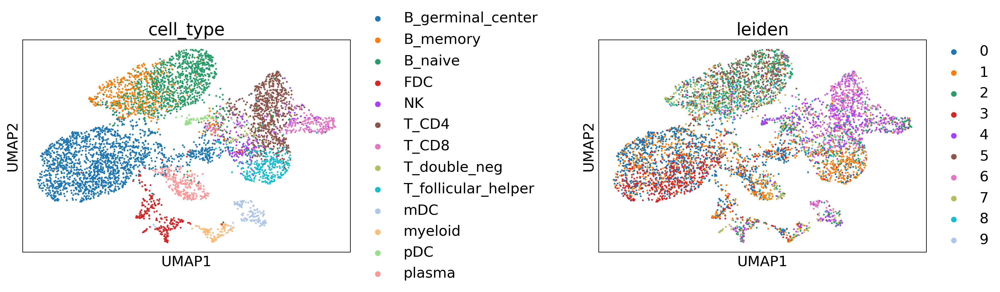

In [304]:
sc.pp.neighbors(adata,use_rep='simvi_z')
sc.tl.umap(adata)
sc.pl.umap(adata,color=['cell_type','leiden'],wspace=0.6)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


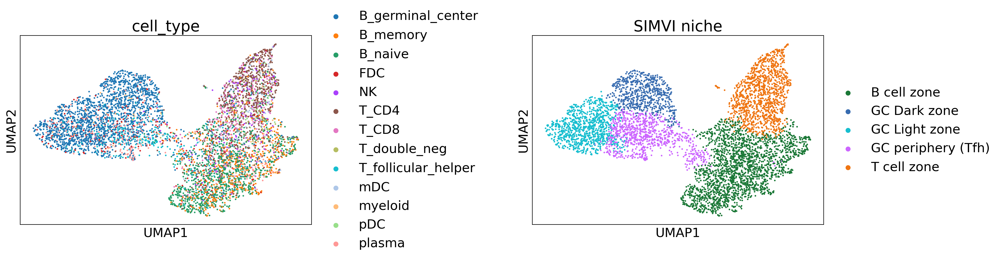

In [12]:
#sc.pp.neighbors(adata,use_rep='simvi_s')
#sc.tl.umap(adata)
#sc.tl.leiden(adata,resolution=0.5)

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18

def annotate(adata,label,names):
    new_cluster_names = np.array(names)
    celltype_label = new_cluster_names[np.array(list(map(int, adata.obs['leiden'].tolist())))]
    adata.obs[label] = celltype_label
    
annotate(adata,'SIMVI niche',['GC Light zone','GC periphery (Tfh)','B cell zone','GC Dark zone','T cell zone', 'B cell zone','T cell zone','B cell zone','B cell zone','T cell zone'])

adata.uns['SIMVI niche_colors'] = ['#1b7837', '#386cb0', '#17becf', '#CC66FF', '#EF7512']

sc.pl.umap(adata,color=['cell_type','SIMVI niche'],wspace=0.6,save='LN_niche.pdf')

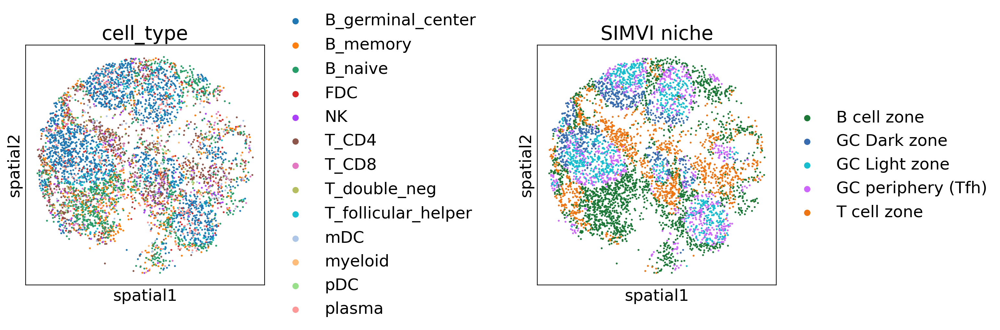

In [13]:
#adata.obsm['spatial'][:,1] = -adata.obsm['spatial'][:,1]
sc.pl.spatial(adata,color=['cell_type','SIMVI niche'],spot_size=25,wspace=0.35,save='LN_niche.pdf')

In [21]:
adata_ = sc.read_h5ad('datasets/slidetag_LN/slidetag_LN_full.h5ad')
sc.pp.normalize_total(adata_)
sc.pp.log1p(adata_)
adata.raw = adata_

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


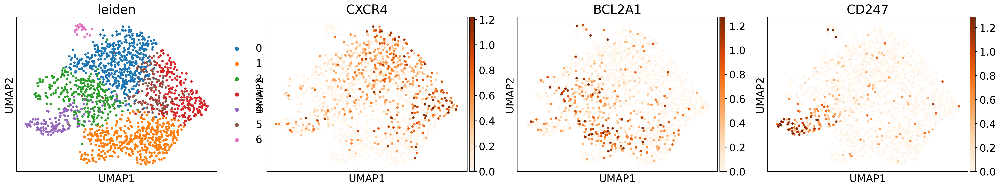

In [56]:
adata_gc = adata[adata.obs['cell_type']=='B_germinal_center'].copy()
adata_gc = adata_gc[adata_gc.obs['SIMVI niche'].isin(['GC periphery (Tfh)','GC Dark zone','GC Light zone'])].copy()
#adata_gc.obs['Niche'] = 'Light zone'
#adata_gc.obs['Niche'][adata.obs['leiden']=='3'] = 'Dark zone'

sc.pp.normalize_total(adata_gc)
sc.pp.log1p(adata_gc)
#sc.pp.scale(adata_gc)
sc.pp.pca(adata_gc)
sc.pp.neighbors(adata_gc)
sc.tl.leiden(adata_gc,resolution=0.6)
sc.tl.umap(adata_gc)
sc.pl.umap(adata_gc,color=['leiden','CXCR4','BCL2A1','CD247'],vmax='p99',cmap='Oranges')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


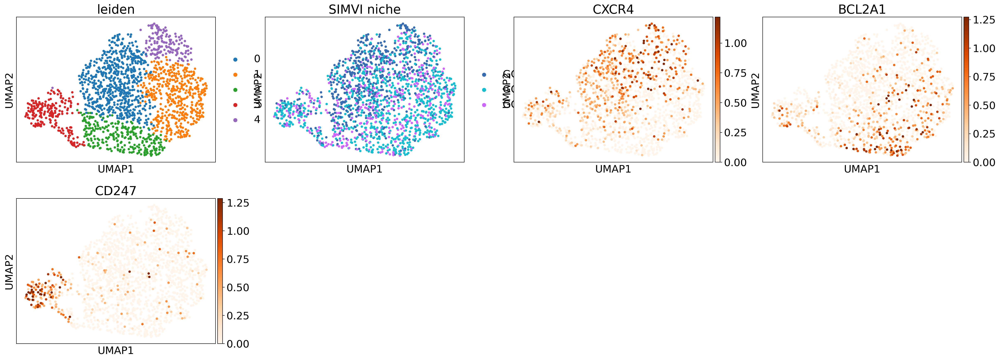

In [58]:
#adata_gc = adata[adata.obs['cell_type']=='B_germinal_center'].copy()
adata_gc.obsm['simvi'] = np.hstack((adata_gc.obsm['simvi_z'],adata_gc.obsm['simvi_s']))
sc.pp.neighbors(adata_gc,use_rep='simvi_z')
sc.tl.leiden(adata_gc,resolution=0.3)
sc.tl.umap(adata_gc)
#sc.tl.leiden(adata_gc,resolution=0.2)
sc.pl.umap(adata_gc,color=['leiden','SIMVI niche','CXCR4','BCL2A1','CD247'],vmax='p99',cmap='Oranges')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


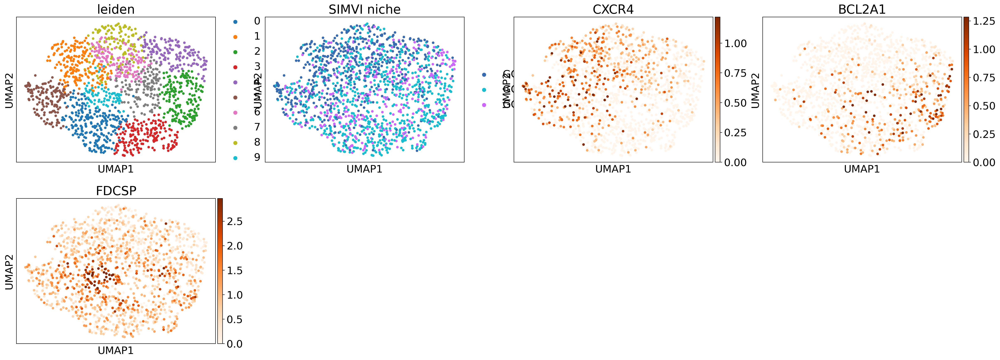

In [60]:
#Filter out CD247+ state
adata_gc_ = adata_gc[adata_gc.obs['leiden']!='3'].copy()
sc.pp.neighbors(adata_gc_,use_rep='simvi_z')
sc.tl.leiden(adata_gc_,resolution=0.7)
sc.tl.umap(adata_gc_)
sc.pl.umap(adata_gc_,color=['leiden','SIMVI niche','CXCR4','BCL2A1','FDCSP'],vmax='p99',cmap='Oranges')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


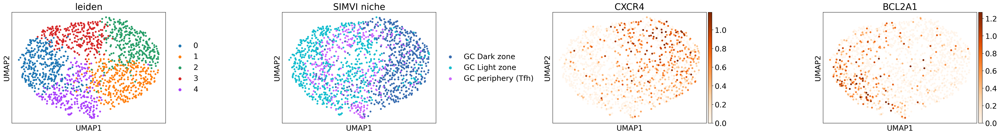

In [97]:
#Filter out FDCSP+ state
#adata_gc_ = adata_gc_[adata_gc_.obs['leiden']!='9'].copy()
adata_gc_.obsm['simvi_'] = adata_gc_.obsm['simvi']-np.mean(adata_gc_.obsm['simvi'],axis=0)
sc.pp.neighbors(adata_gc_,use_rep='simvi_',metric='cosine')
sc.tl.leiden(adata_gc_,resolution=0.5)
sc.tl.umap(adata_gc_)
sc.pl.umap(adata_gc_,color=['leiden','SIMVI niche','CXCR4','BCL2A1'],vmax='p99',cmap='Oranges',wspace=0.6)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


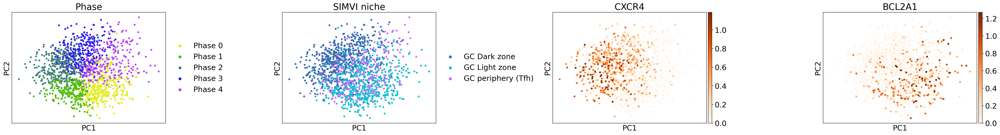

In [307]:
#adata_gc_.obsm['X_pca'] = sc.pp.pca(adata_gc_.obsm['simvi'])
sc.pl.pca(adata_gc_,color=['Phase','SIMVI niche','CXCR4','BCL2A1'],vmax='p99',cmap='Oranges',wspace=0.6)

In [311]:
import seaborn as sns
import colorcet as cc

adata_gc_.obs['Phase'] = 'Phase 0'
adata_gc_.obs['Phase'][adata_gc_.obs['leiden']=='3'] = 'Phase 1'
adata_gc_.obs['Phase'][adata_gc_.obs['leiden']=='2'] = 'Phase 2'
adata_gc_.obs['Phase'][adata_gc_.obs['leiden']=='1'] = 'Phase 3'
adata_gc_.obs['Phase'][adata_gc_.obs['leiden']=='4'] = 'Phase 4'

#adata_gc_.obs['Niche_'] = (adata_gc_.obs['SIMVI niche']=='GC Dark zone') * 1
#adata_gc_.obs['CXCR4_'] = adata_gc_.raw[:,'CXCR4'].X.toarray().flatten()

plte = list(np.array(cc.colorwheel)[[135,180,215,0,45,90]])

plte

['#e0ed20', '#52bc0c', '#45827c', '#2e21ea', '#bb42fa', '#fba0b2']

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


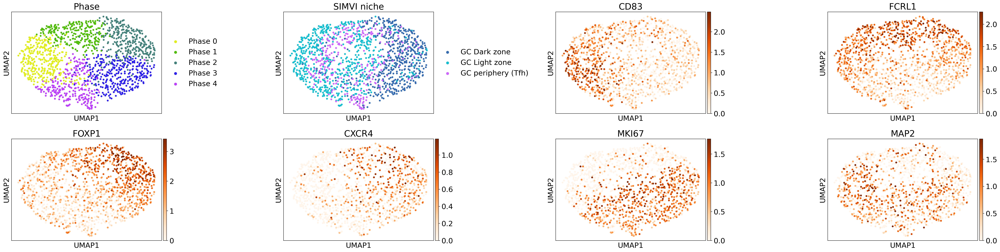

In [147]:
adata.uns['Phase_colors'] = plte
sc.pl.umap(adata_gc_,color=['Phase','SIMVI niche','CD83','FCRL1','FOXP1','CXCR4','MKI67','MAP2'],vmax='p99',cmap='Oranges',wspace=0.65,save='LN_phase.pdf')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


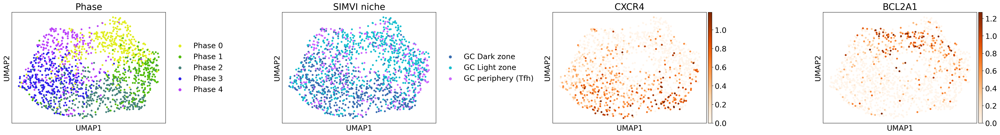

In [195]:
adata_gc_2 = adata_gc_.copy()
sc.pp.pca(adata_gc_2)
sc.pp.neighbors(adata_gc_2,metric='cosine')
sc.tl.umap(adata_gc_2)
sc.pl.umap(adata_gc_2,color=['Phase','SIMVI niche','CXCR4','BCL2A1'],vmax='p99',cmap='Oranges',wspace=0.6,save='LN_pca.pdf')

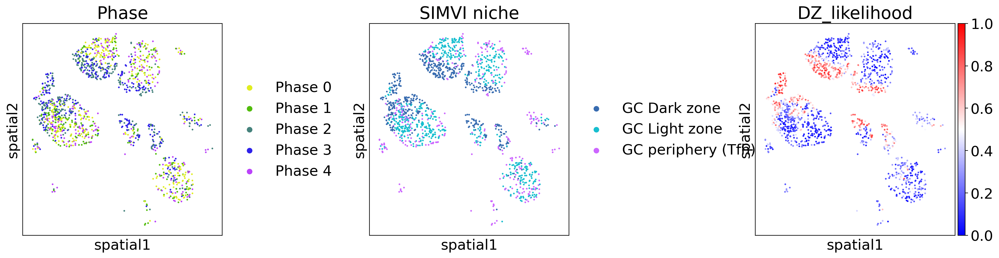

In [213]:
sc.pl.spatial(adata_gc_,color=['Phase','SIMVI niche','DZ_likelihood'],spot_size=25,save='LN_tmp.pdf',cmap='bwr',vmin=0,vmax=1)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


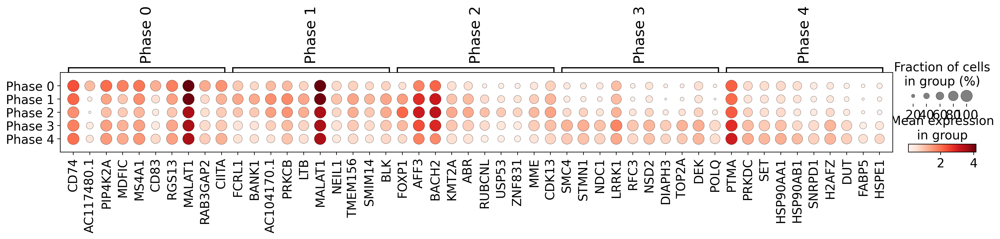

In [187]:
sc.tl.rank_genes_groups(adata_gc_,'Phase')
sc.pl.rank_genes_groups_dotplot(adata_gc_,n_genes=10,dendrogram=False,min_logfoldchange=0.5,save='LN_phase.pdf')

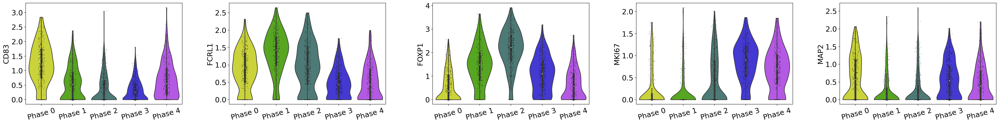

In [144]:
sc.pl.violin(adata_gc_,['CD83','FCRL1','FOXP1','MKI67','MAP2'],'Phase',inner='box',rotation=15,save='LN_phase.pdf')

In [301]:
adata_gc_.write('LN_GC.h5ad')

In [310]:
adata.obs.to_csv('Bio_results/slidetag/adata_obs.csv')